### Imports

In [1]:
# General
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from tqdm import tqdm
import plotly.graph_objects as go
import plotly.express as px
import capir_transfronteriza2_2023.data.load as load

# Topic modeling
from sentence_transformers import SentenceTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
from umap import UMAP
from sklearn.cluster import KMeans
from hdbscan import HDBSCAN

/home/fxr/.local/share/virtualenvs/capir_transfronteriza2_2023-f1a4fPBO/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/fxr/.local/share/virtualenvs/capir_transfronteriza2_2023-f1a4fPBO/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(

### Load data

In [2]:
data_processed = load.data_processed
assets = load.assets

### Read data from Colombia

In [3]:
data = pd.read_csv(f"{data_processed}/colombia.csv")

print(data.shape)

data.head(3)

(57477, 4)


,user_screen_name,country,text,text_clean
0,MariaFdaCabal,Colombia,Peligro que personas señaladas por Rosa Blanca...,Peligro que personas señaladas por Rosa Blanca...
1,MariaFdaCabal,Colombia,¡Al fin! El gobierno de la potencia mundial de...,¡Al fin! El gobierno de la potencia mundial de...
2,MariaFdaCabal,Colombia,"Qué buen artículo. ""Sandeces democratíceras"". ...","Qué buen artículo. ""Sandeces democratíceras""."


### Process data

In [4]:
country = data[data['text_clean'].apply(lambda x: isinstance(x, (str, bytes)))]

country['text_cluster'] = country['text'].apply(lambda x: x.replace('\n',''))

print(country.shape)

(54974, 5)


/tmp/ipykernel_58249/1630503326.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country['text_cluster'] = country['text'].apply(lambda x: x.replace('\n',''))


### Create embeddings

In [5]:
# Load model to generate embeddings
sbert_model = SentenceTransformer('all-MiniLM-L6-v2')

In [6]:
# Process data with encoder
vecs = sbert_model.encode(country["text_clean"].values)

In [7]:
# Apply the dimensionality reduction process.

# Scaler to normalize data
scaler = StandardScaler()
# PCA to reduce multicollinearity and noise
pca_ = PCA(0.9, random_state=5)
# UMAP to reduce dimensionality to two components
umap_ = UMAP(n_components=2,
             random_state=5,
             metric="cosine",
             n_neighbors=50,
             min_dist=0.1)

vecs_sc = scaler.fit_transform(vecs)
vecs_pca = pca_.fit_transform(vecs_sc)
vecs_umap = umap_.fit_transform(vecs_pca)

In [8]:
# Assign components to dataset
country.loc[:,"COMP_1"] = vecs_umap[:,0]
country.loc[:,"COMP_2"] = vecs_umap[:,1]

# Show data
country.head()

/tmp/ipykernel_58249/4075971638.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country.loc[:,"COMP_1"] = vecs_umap[:,0]
/tmp/ipykernel_58249/4075971638.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  country.loc[:,"COMP_2"] = vecs_umap[:,1]


,user_screen_name,country,text,text_clean,text_cluster,COMP_1,COMP_2
0,MariaFdaCabal,Colombia,Peligro que personas señaladas por Rosa Blanca...,Peligro que personas señaladas por Rosa Blanca...,Peligro que personas señaladas por Rosa Blanca...,5.661910,2.847879
1,MariaFdaCabal,Colombia,¡Al fin! El gobierno de la potencia mundial de...,¡Al fin! El gobierno de la potencia mundial de...,¡Al fin! El gobierno de la potencia mundial de...,4.021524,2.784703
2,MariaFdaCabal,Colombia,"Qué buen artículo. ""Sandeces democratíceras"". ...","Qué buen artículo. ""Sandeces democratíceras"".","Qué buen artículo. ""Sandeces democratíceras"". ...",4.688560,3.120051
3,MariaFdaCabal,Colombia,Los izquierdópatas en Colombia aplauden el lem...,Los izquierdópatas en Colombia aplauden el lem...,Los izquierdópatas en Colombia aplauden el lem...,6.964063,4.052229
4,MariaFdaCabal,Colombia,Denuncian llegada de presuntos colectivos vene...,Denuncian llegada de presuntos colectivos vene...,Denuncian llegada de presuntos colectivos vene...,4.018866,4.329624


In [9]:
# Visualize the distribution of embeddings with a hover to see the tweets.
fig = px.scatter(
    country,
    x="COMP_1",
    y="COMP_2",
    hover_data=["user_screen_name", "text_clean"])
fig.write_html(f"{assets}/colombia/colombia.html")
fig.show()

### Clustering

In [10]:
# Apply the HDBSCAN algorithm to extract the clusters.

mc_size = 100
m_samples = 1

db_model = HDBSCAN(min_cluster_size=mc_size,
                   min_samples=m_samples,
                   metric="euclidean", 
                   )
db_model.fit(country.loc[:,["COMP_1", "COMP_2"]])
country.loc[:, "CLUSTER"] = db_model.labels_
country.loc[:, "PROBA"] = db_model.probabilities_

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

/tmp/ipykernel_58249/2719550865.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_58249/2719550865.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



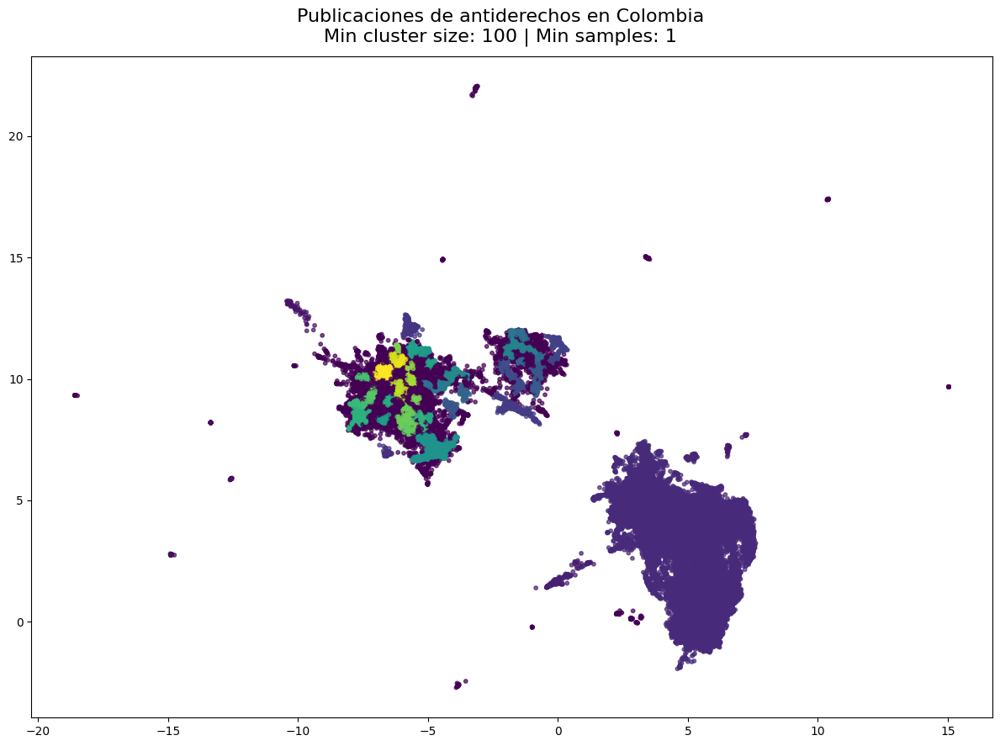

In [11]:
# Visualize clusters
plt.figure(figsize=(12,9))
plt.scatter(vecs_umap[:,0], vecs_umap[:,1], alpha=0.7, c=db_model.labels_, s=10)
plt.suptitle(f"Publicaciones de antiderechos en Colombia\nMin cluster size: {mc_size} | Min samples: {m_samples}", fontsize=16)
plt.tight_layout()
plt.savefig(f"{assets}/colombia/colombia_clusters")
plt.show()

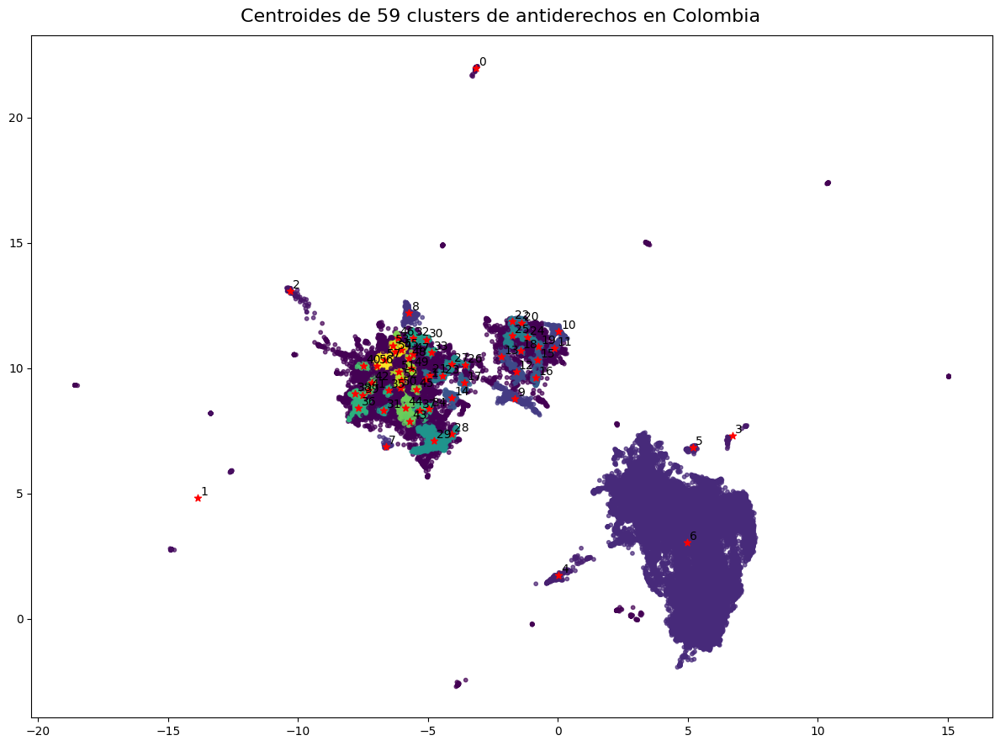

In [12]:
# Extract the centroid of each cluster

cl_centroids = {}

for i in sorted(country["CLUSTER"].unique()):

  cl_centroids[i] = country[country["CLUSTER"] == i][["COMP_1", "COMP_2"]].mean().values

centroids_array = np.array(list(cl_centroids.values()))

fig, ax = plt.subplots(figsize=(12,9))
ax.scatter(vecs_umap[:,0], vecs_umap[:,1], s=10, alpha=0.7, c=db_model.labels_)
ax.scatter(centroids_array[:,0], centroids_array[:,1], marker="*", c="red")
for i in cl_centroids:
  ax.annotate(i, cl_centroids.get(i)+np.array([0.1, 0.1]))
plt.suptitle(f"Centroides de {len(cl_centroids)} clusters de antiderechos en Colombia", fontsize=16)
plt.tight_layout()
plt.savefig(f"{assets}/colombia/colombia_centroids", dpi=fig.dpi)
plt.show()

In [15]:
from sklearn.metrics.pairwise import euclidean_distances

N = 20

with open(f"{assets}/colombia/colombia.txt", 'w') as f:
  for i in cl_centroids:
    point = cl_centroids.get(i).reshape(1,-1)
    ix_min_dist = np.argsort(euclidean_distances(point, country.loc[:, ["COMP_1", "COMP_2"]])).flatten()[:N]
    print(f"\n[Tweets más representativos del cluster {i}]", file=f)
    users = country.iloc[ix_min_dist, country.columns.get_loc("user_screen_name")].values
    texts = country.iloc[ix_min_dist, country.columns.get_loc("text_cluster")].values
    tweets = [[x, y] for x, y in zip(users, texts)]
    print('\n'.join([': '.join(map(str, inner_list)) for inner_list in tweets]), file=f)
